In [1]:
import re
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
with open(
    file="ТИУ Сущности База знаний.txt",
    mode="r",
    encoding="utf-8"
) as file:
    data = file.read()
    
len(data)

271386

In [3]:
entity_pattern = re.compile(r'\(entity\|([^|]+)\|([^|]+)\|([^|]+)\)')

relationship_pattern = re.compile(r'\(relationship\|([^|]+)\|([^|]+)\|([^|]+)\|([^|]+)\)')

In [4]:
entities = []
for match in entity_pattern.finditer(data):
    entity_name, entity_type, entity_description = match.groups()
    entities.append({
        "name": entity_name.strip(),
        "type": entity_type.strip(),
        "description": entity_description.strip()
    })
    
len(entities)

1592

In [15]:
entities[1530]

{'name': 'ОСОБЫЕ_ПРАВА',
 'type': 'ПРАВО',
 'description': 'особые права на поступление'}

In [6]:
relationships = []
for match in relationship_pattern.finditer(data):
    source, target, relation_type, relation_description = match.groups()
    relationships.append({
        "source": source.strip(),
        "target": target.strip(),
        "type": relation_type.strip(),
        "description": relation_description.strip()
    })
    
len(relationships)

1177

In [7]:
relationships[1150]

{'source': 'ПРОХОДНЫЕ_БАЛЛЫ',
 'target': 'БЮДЖЕТНАЯ_ФОРМА_ОБУЧЕНИЯ',
 'type': 'СВЯЗАНО_С',
 'description': 'Проходные баллы используются при бюджетной форме обучения'}

In [8]:
G = nx.DiGraph()

for entity in entities:
    G.add_node(
        entity["name"], 
        type=entity["type"], 
        description=entity["description"]
    )

for relation in relationships:
    G.add_edge(
        relation["source"], 
        relation["target"], 
        type=relation["type"], 
        description=relation["description"]
    )

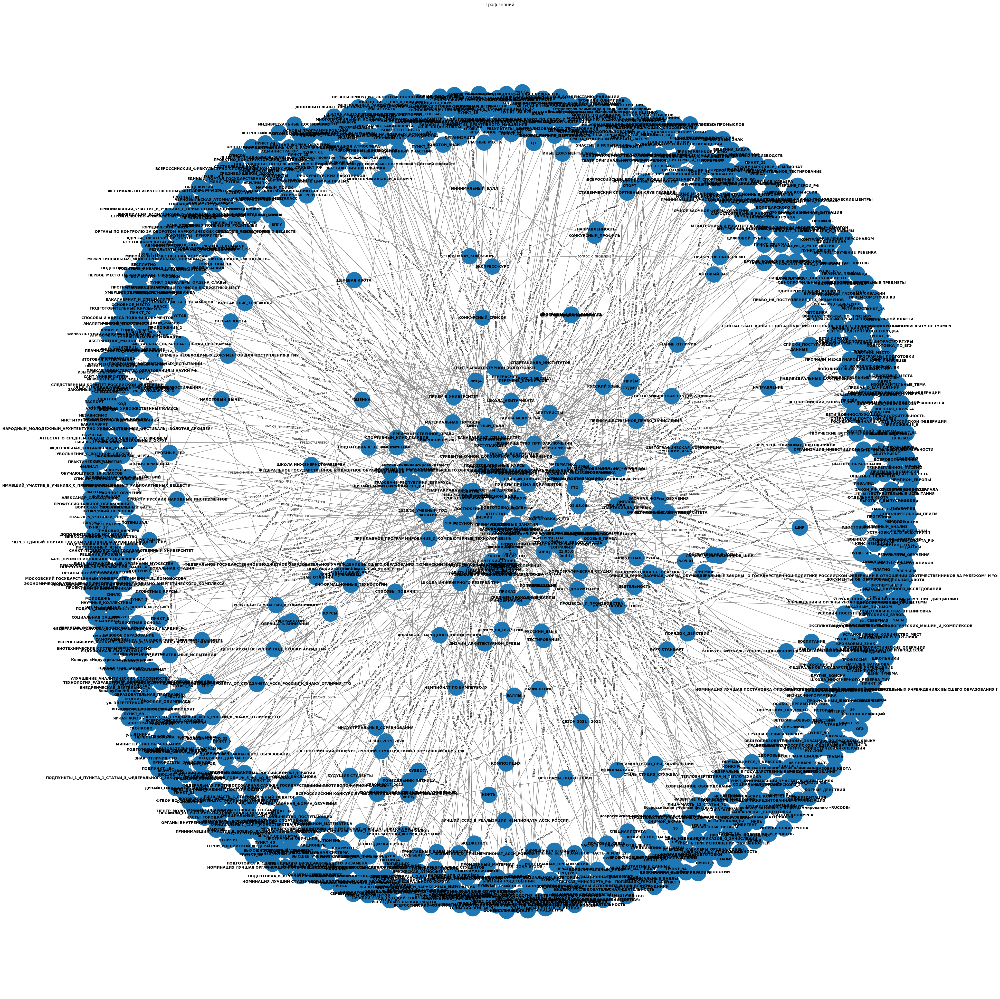

In [9]:
pos = nx.spring_layout(G, seed=42)
plt.figure(figsize=(50, 50))

nx.draw_networkx_nodes(
    G, pos, 
    node_size=2000, 
)

nx.draw_networkx_edges(G, pos, edge_color="gray", arrowstyle="->", arrowsize=20)

nx.draw_networkx_labels(G, pos, font_size=10, font_weight="bold")

edge_labels = {(u, v): G.edges[u, v]["type"] for u, v in G.edges}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8)

plt.title("Граф знаний")
plt.axis("off")
plt.show()

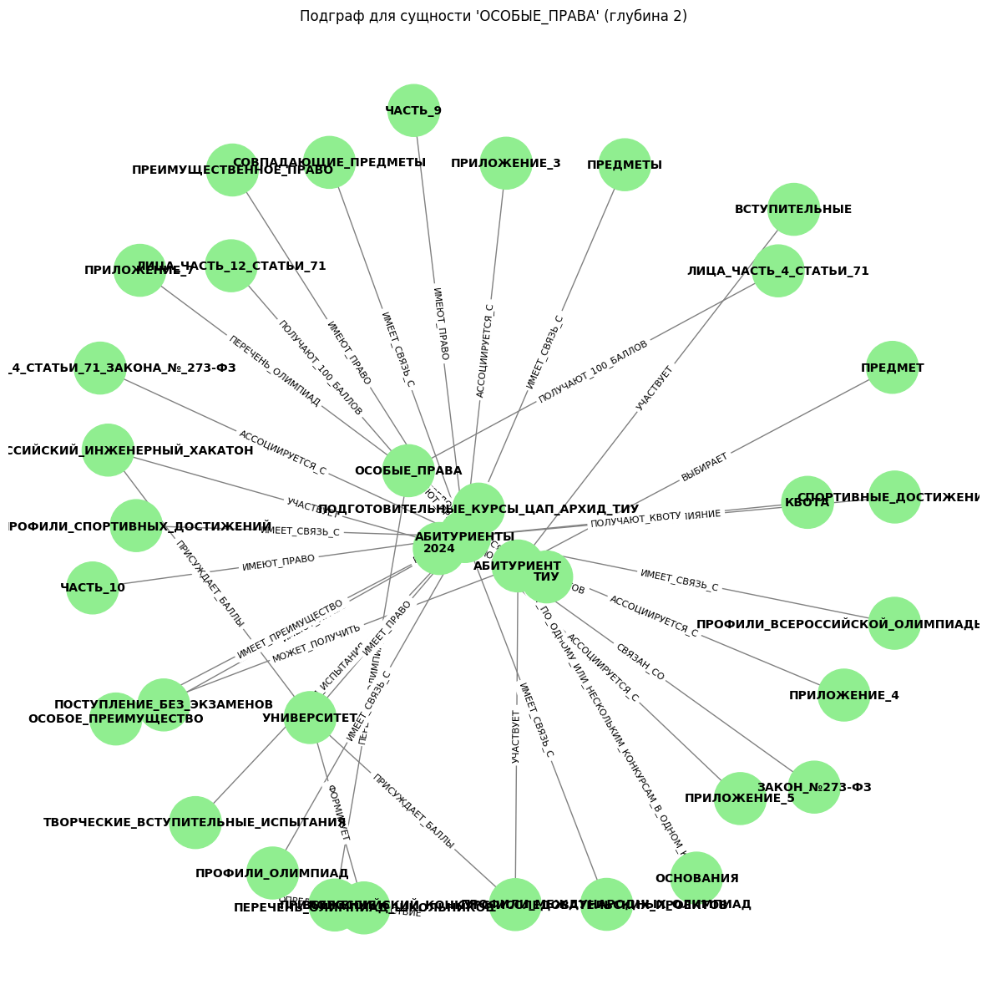

In [16]:
def extract_subgraph(graph, entity, depth=1):
    if entity not in graph:
        raise ValueError(f"Сущность '{entity}' не найдена в графе.")
    subgraph = nx.ego_graph(graph, entity, radius=depth, undirected=True)
    return subgraph


depth = 2
entity = "ОСОБЫЕ_ПРАВА"
subgraph = extract_subgraph(G, entity, depth)

pos = nx.spring_layout(subgraph, seed=42)
plt.figure(figsize=(15, 15))

node_colors = ["lightblue" if subgraph.nodes[node].get("type") == "ОРГАНИЗАЦИЯ" else "lightgreen" for node in subgraph.nodes]
nx.draw_networkx_nodes(subgraph, pos, node_size=2000, node_color=node_colors)
nx.draw_networkx_edges(subgraph, pos, edge_color="gray", arrowstyle="->", arrowsize=20)
nx.draw_networkx_labels(subgraph, pos, font_size=10, font_weight="bold")
edge_labels = {(u, v): subgraph.edges[u, v]["type"] for u, v in subgraph.edges}
nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_size=8)
plt.title(f"Подграф для сущности '{entity}' (глубина {depth})")
plt.axis("off")
plt.show()